# Vision por computadora I - TP2

Por Menara Agustin - menaragustin@gmail.com

Tiempo de ejecución estimado: 96segs

In [1]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import time
import os
import pywt 
# %matplotlib 

In [2]:
# Marca temporal para estimar tiempo de ejecución del notebook
since = time.time()

## Transformada de Fourier en 2D
Podemos interpretar los cambios de intensidad de la imagen como funciones sobre un plano

## Filtros en el dominio espectral

### Funciones auxiliares

In [3]:

def fft2_mod(image):

  shifted_image_fft = np.fft.fftshift(np.fft.fft2(image))
  return 20*np.log(np.abs(shifted_image_fft))


def _filter_round_shape(height, width, radius):
  canvas = np.zeros((height, width))
  return cv.circle(canvas,
                     center=(int(canvas.shape[1]/2), int(canvas.shape[0]/2)),
                     radius=radius,
                     color=(255),
                     thickness=-1).astype(np.uint8)


def create_lp_filter(height, width, radius=20):

  lp_filter = _filter_round_shape(height, width, radius)
  return lp_filter


def create_hp_filter(height, width, radius=60):

  lp_filter = _filter_round_shape(height, width, radius)
  return cv.bitwise_not(lp_filter)


def plot_results(results, figsize=(20,5)):

    plt.figure(figsize=figsize)
    n_images = len(list(results.keys()))
    
    for i,item in enumerate(results.items()):
        k,v = item
        
        plt.subplot(1,n_images,i+1)
        plt.axis('off')
        plt.title(k)
        if type(v[1]) != str:
            plt.plot(v[0],v[1])
        else:
            plt.imshow(v[0], cmap=v[1])

    plt.show()

### FFT aplicada a una imagen

In [4]:
# leo la imagen en escala de grises
img = cv.imread('fft_alfa_pred.png', cv.IMREAD_GRAYSCALE)
# obtengo el modulo de la transformada de fourier
mod = fft2_mod(img)

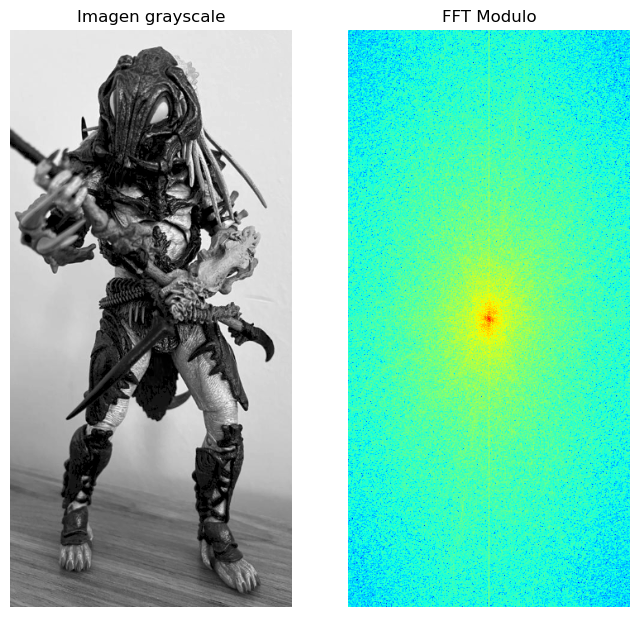

In [5]:
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.axis('off')
plt.imshow(img, cmap='gray')
plt.title('Imagen grayscale')
plt.subplot(1,2,2)
plt.axis('off')
plt.imshow(mod, cmap='jet')
plt.title('FFT Modulo')
plt.show()

### Definimos los filtros en el dominio espectral

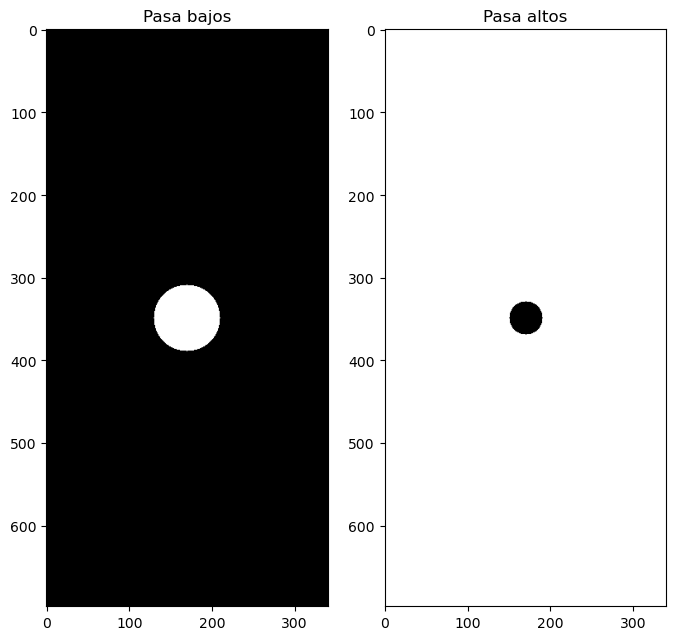

In [6]:
h, w = img.shape
lp_filter = create_lp_filter(h, w, radius=40)
hp_filter = create_hp_filter(h, w, radius=20)

plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.imshow(lp_filter, cmap='gray')
plt.title('Pasa bajos')
plt.subplot(1,2,2)
plt.title('Pasa altos')
plt.imshow(hp_filter, cmap='gray')
plt.show()

### Aplicamos los filtros a la imagen

In [7]:
# vuelvo a calcular la FFT. Para aplicar el filtro 
# necesito la transformada en modulo y fase en el dominio
# de los numeros complejos
shifted_fft = np.fft.fftshift(np.fft.fft2(img))
lp_filtered = shifted_fft * lp_filter
hp_filtered = shifted_fft * hp_filter

# Aplicamos la antitransformada y obtenemos las imagenes filtradas
f_ishift = np.fft.ifftshift(lp_filtered)
img_lp = np.real(np.fft.ifft2(f_ishift))
f_ishift = np.fft.ifftshift(hp_filtered)
img_hp = np.real(np.fft.ifft2(f_ishift))

### Graficamos los resultados

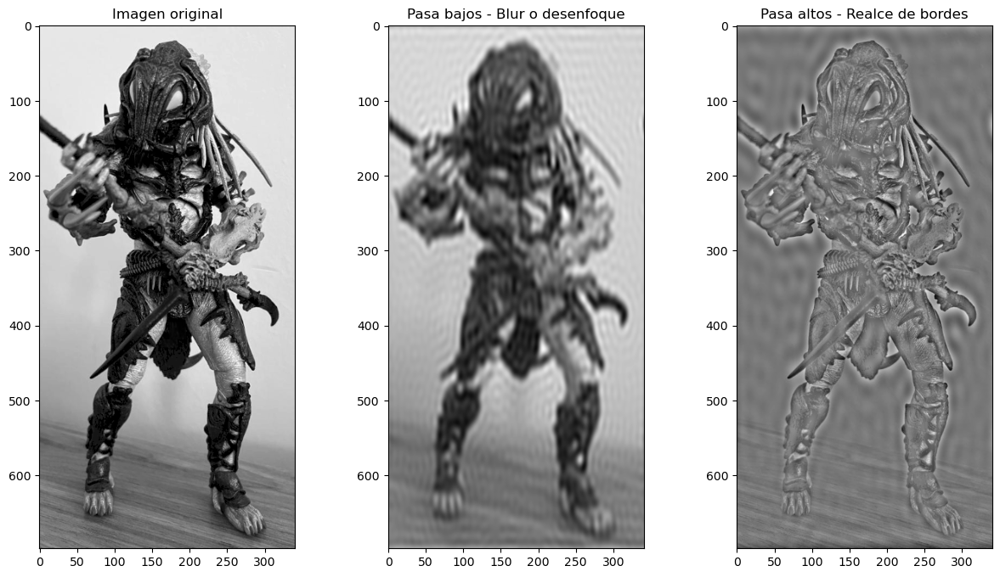

In [8]:
n_fig = 3

plt.figure(figsize=(15,8))
plt.subplot(1,n_fig,1)
plt.imshow(img, cmap='gray')
plt.title('Imagen original')
plt.subplot(1,n_fig,2)
plt.imshow(img_lp, cmap='gray')
plt.title('Pasa bajos - Blur o desenfoque')
plt.subplot(1,n_fig,3)
plt.title('Pasa altos - Realce de bordes')
plt.imshow(img_hp, cmap='gray')

plt.show()

### Filtro gausiano

**Implementar la función create_gauss_filter(h, w, k_size, sigma) para crear filtros gaussianos para 
filtrado espectral. Debe retornar un filtro gaussiano de tamaño HxW en dominio espacial y su transformada 
de Fourier.**

In [9]:
def create_gauss_filter(h, w, k_size=5, sigma=5):
    
    # Generacion de kernel gaussiano
    nucleo_g = cv.getGaussianKernel(ksize=k_size, sigma=sigma)
    kernel = nucleo_g * nucleo_g.T

    # Calculo de padding
    border = int((h-k_size)/2), int((w-k_size)/2)

    # Chequeo para mantener h y w
    if border[0]*2+k_size < h:
        top = border[0]+1
    else:
        top = border[0]
    bot = border[0]

    if border[1]*2+k_size < w:
        rig = border[1]+1
    else:
        rig = border[1]
    lef = border[1]

    # Padding del kernel gaussiano con ceros
    constant = cv.copyMakeBorder(kernel, top, bot, rig, lef , cv.BORDER_CONSTANT, value=0.0)
    
    # FFT
    constant_fft = np.fft.fft2(constant)
    
    return constant, constant_fft

**Graficar ambas representaciones para diferentes tamaños de kernel y sigma. Aplicar el filtro una 
imagen para validar el funcionamiento en el dominio espectral.**

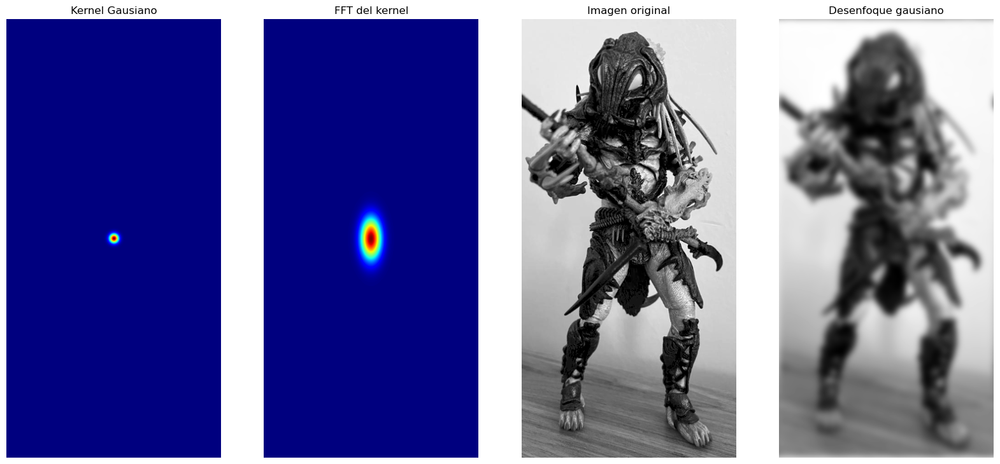

In [10]:
n_figs = 4
h,w = img.shape
k_size = 40
sigma = 5

kernel, kernel_tf = create_gauss_filter(h, w, k_size=k_size, sigma=sigma)

plt.figure(figsize=(20,10))
plt.subplot(1,n_figs,1)
plt.axis('off')
plt.title("Kernel Gausiano")
plt.imshow(kernel, cmap='jet')

plt.subplot(1,n_figs,2)
plt.axis('off')
plt.title("FFT del kernel")
tf_shifted = np.fft.fftshift(kernel_tf)
plt.imshow(np.abs(tf_shifted), cmap='jet')

plt.subplot(1,n_figs,3)
plt.axis('off')
plt.title("Imagen original")
plt.imshow(img, cmap='gray')

plt.subplot(1,n_figs,4)
plt.axis('off')
plt.title('Desenfoque gausiano')
img_fft = np.fft.fft2(img)
filtered = img_fft * kernel_tf
img_gauss = np.fft.ifftshift(np.real(np.fft.ifft2(filtered)))
plt.imshow(img_gauss, cmap='gray')
plt.show()


Se valida el funcionamiento del filtro en el dominio espectral.

En las figuras de arriba se puede ver el kernel gausiano generado para la imagen particular, y su fft. Si bien la transformada de una gausiana es también una gausiana, se ve deformada como consecuencia de la relación de aspecto de la imagen. 

A continuación se aplican varios filtrados a la misma imagen, recorriendo distintos sigmas y tamaños de kernel.

Se itrea primero en sigma y después en kernel size para poder como afecta el tamaño del kernel al sigma definido.

También se agregan varios resultados parciales de interés para el análisis.

K_size:  3  Sigma:  1


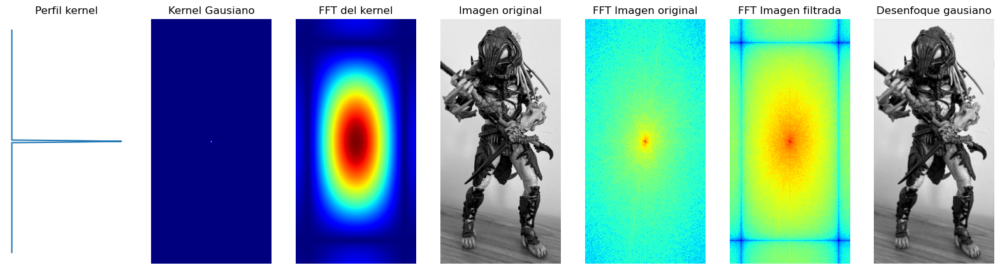

K_size:  10  Sigma:  1


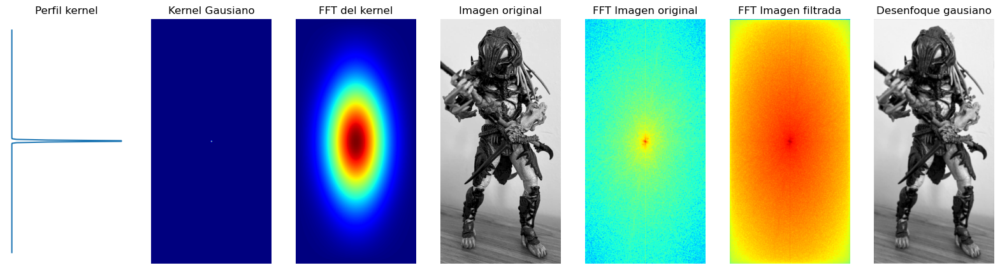

K_size:  50  Sigma:  1


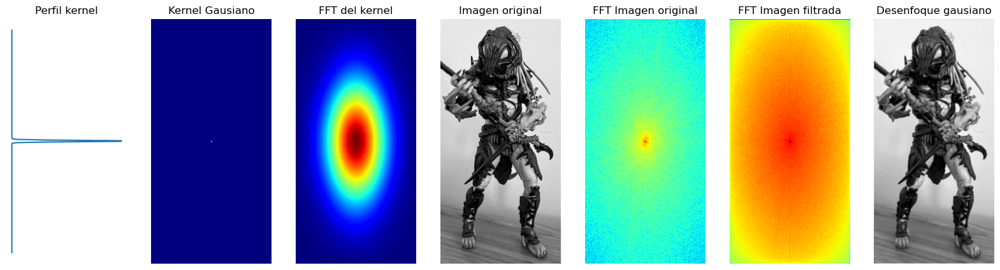

K_size:  100  Sigma:  1


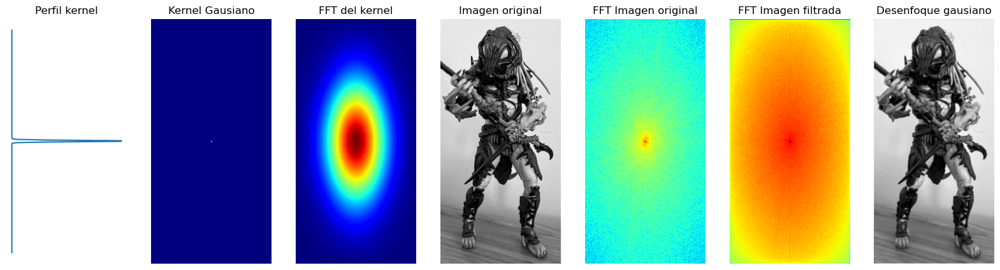

K_size:  3  Sigma:  10


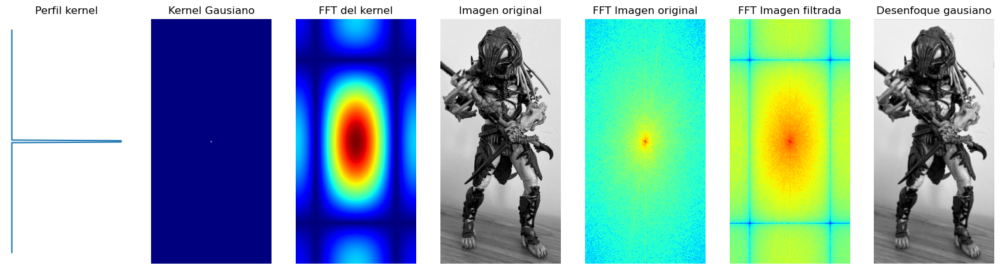

K_size:  10  Sigma:  10


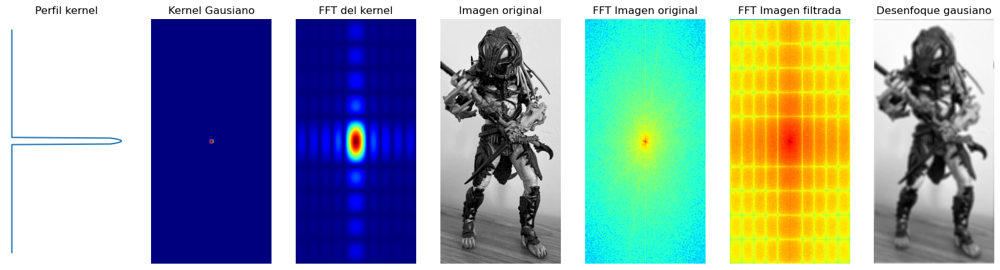

K_size:  50  Sigma:  10


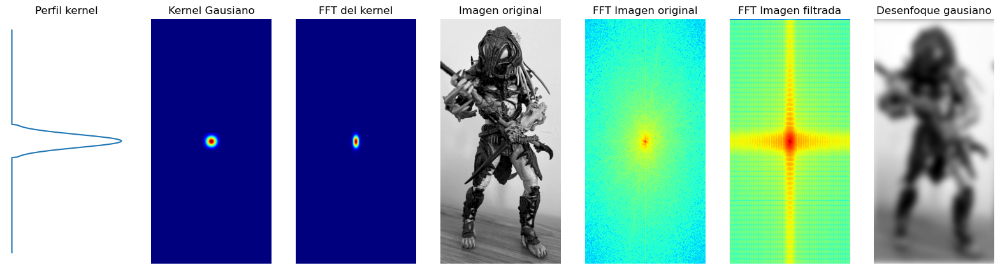

K_size:  100  Sigma:  10


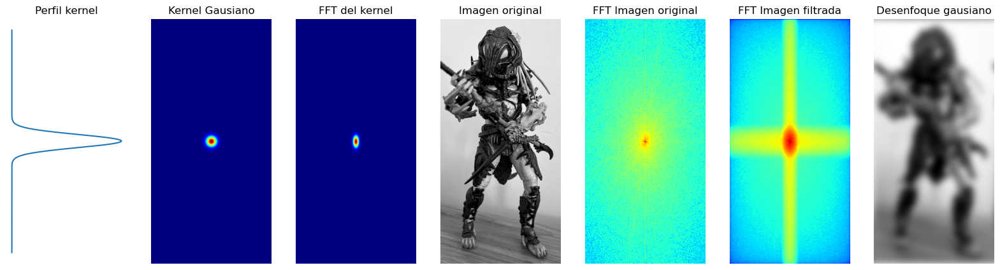

K_size:  3  Sigma:  100


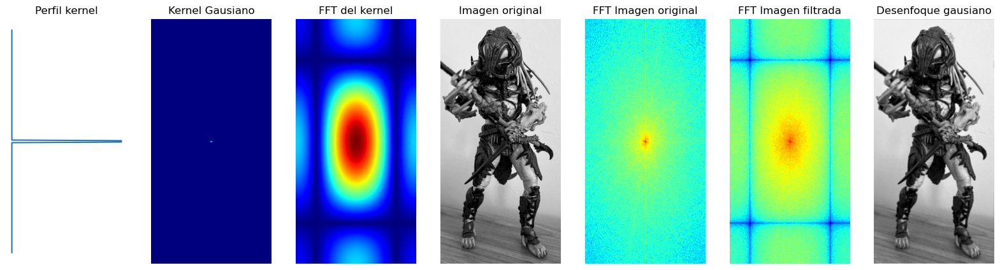

K_size:  10  Sigma:  100


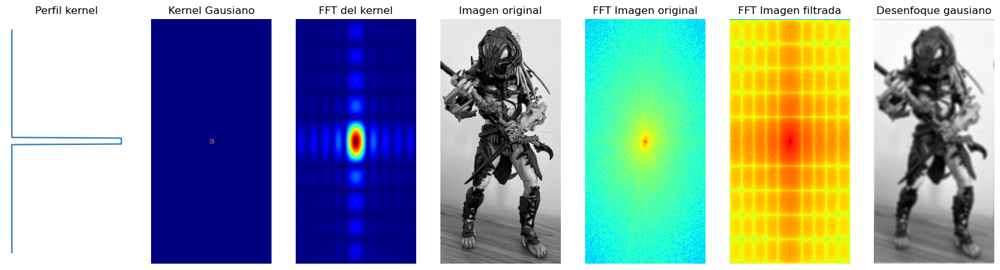

K_size:  50  Sigma:  100


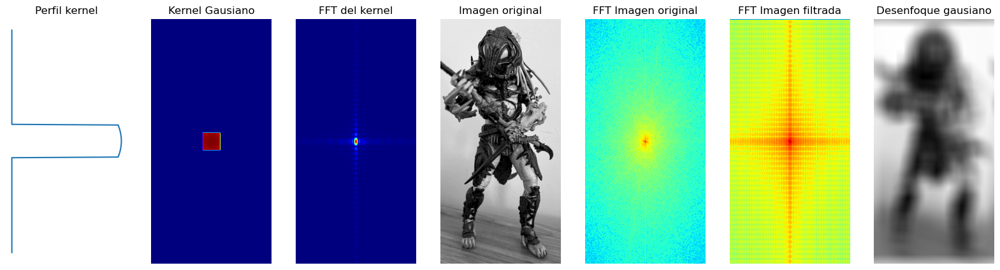

K_size:  100  Sigma:  100


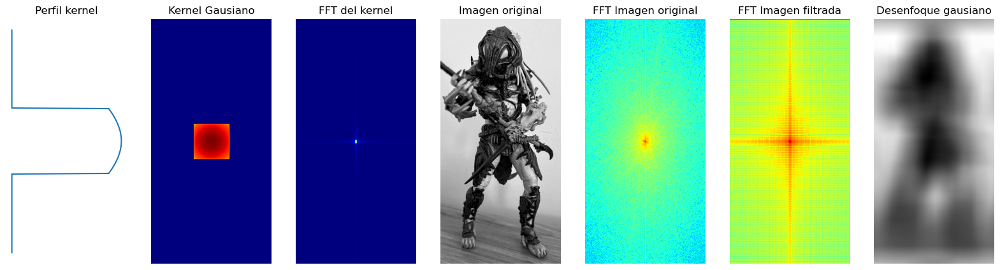

In [11]:
# Loop distintos k_size y sigmas
h,w = img.shape

k_size = [3,10,50,100]
sigmas = [1,10,100]

for sigma in sigmas:
    for size in k_size:
    
        print('K_size: ', size, ' Sigma: ', sigma)
        # Generacion del kernel gausiano y su transformada
        kernel, kernel_tf = create_gauss_filter(h, w, k_size=size, sigma=sigma)
        
        # Se toma el perfil central del kernel espacial para graficar
        line1 = kernel[int(h/2),:]
        # Se realiza el desplazamiento del kernel en frecuencia para visualizar
        tf_shifted = np.fft.fftshift(kernel_tf)

        # Transformada de Fourier de la imagen
        img_fft = np.fft.fft2(img)
        # Procesamiento de la  fft para visualizar
        img_fft_mod = fft2_mod(img)

        # Filtrado en frecuenca mediante convolución
        filtered = img_fft * kernel_tf
        # Volvemos al dominio espacial para visualizar el efecto del filtrado
        img_gauss = np.fft.ifftshift(np.real(np.fft.ifft2(filtered)))
        
        # Diccionario de resultados para plotear
        results = {
            "Perfil kernel": (line1, range(w)),
            "Kernel Gausiano": (kernel, 'jet'),
            "FFT del kernel": (np.abs(tf_shifted), 'jet'),
            "Imagen original": (img, 'gray'),
            "FFT Imagen original": (img_fft_mod, 'jet'),
            "FFT Imagen filtrada": (fft2_mod(img_gauss), 'jet'),
            "Desenfoque gausiano": (img_gauss, 'gray')
        }

        plot_results(results, figsize=(20,5))
        
        

La primer conclusión a extraer es que a mayor sigma, más peso tienen los pixeles vecinos y por lo tanto mayor nivel de desenfoque se logra.

En el dominio de la frecuencia se puede ver en la FFT de la imagen filtrada como sobreviven las frecuencias centrales del espectro, que se corresponden con las bajas frecuencias.

Otro aspecto interesante surge de la interacción entre tamaño del kernel y sigma. 

En las primeras capturas se puede ver como un sigma pequeño, cuando no se ve afectado por el kernel, es decir, que no se trunca a cero como consecuencia del k_size, tiene el mismo resultado. 

Por otro lado, cuando la gausiana se ve interrumpida por el k_size, se pierde la armonía del kernel y es cuando aparecen los flancos bien marcados en el dominio espacial y las bandas filtradas de alta frecuencia en el domino espectral, alejadas del centro del kernel. 

**Filtro pasa altos**

Como ejercicio adicional se implementa el mismo bucle previo pero modificando el kernel generado para construir un pasa altos o detector de bordes.

K_size:  3  Sigma:  1


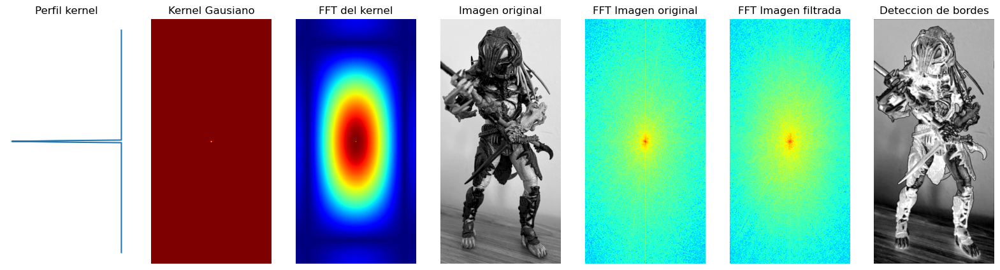

K_size:  10  Sigma:  1


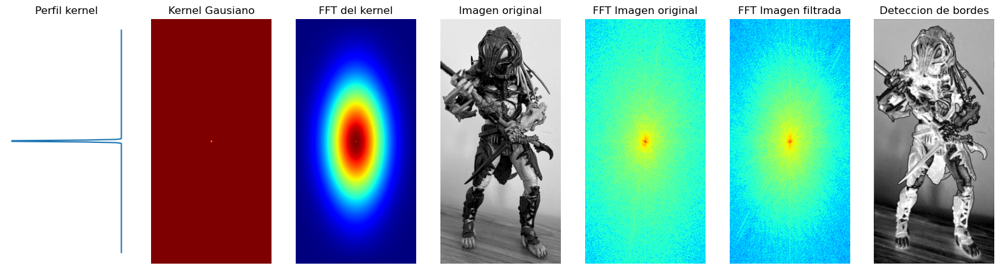

K_size:  50  Sigma:  1


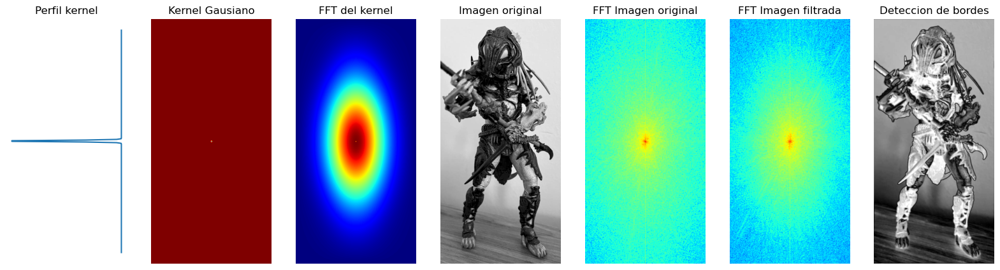

K_size:  100  Sigma:  1


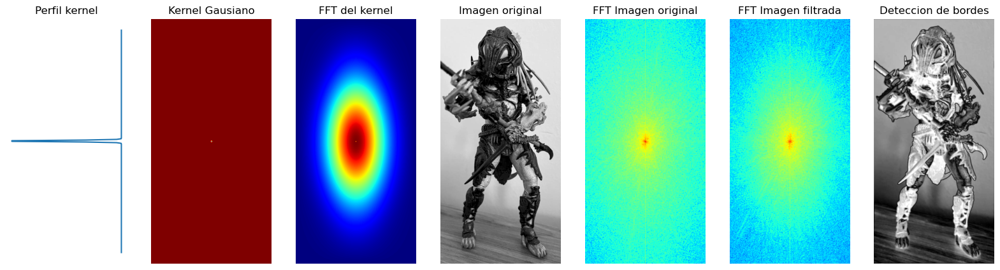

K_size:  3  Sigma:  10


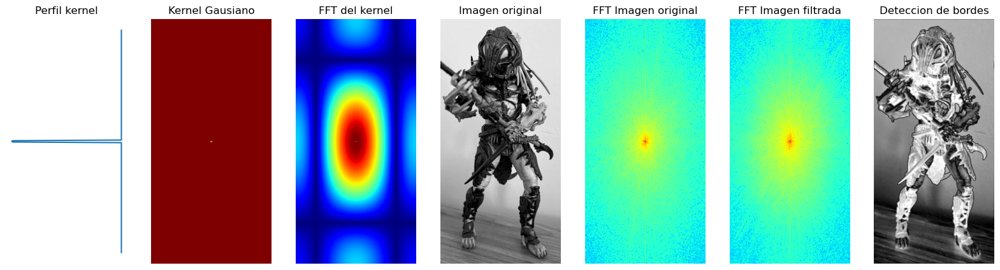

K_size:  10  Sigma:  10


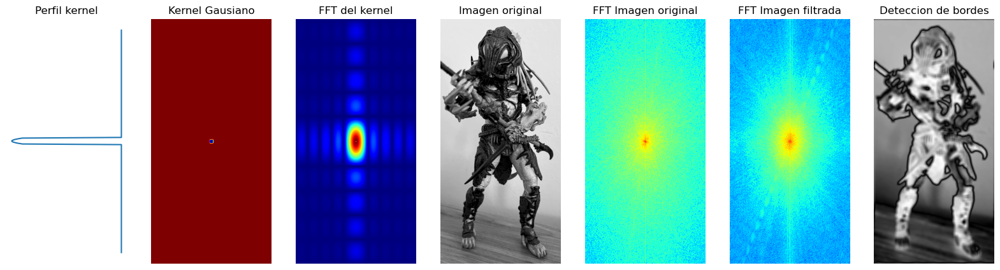

K_size:  50  Sigma:  10


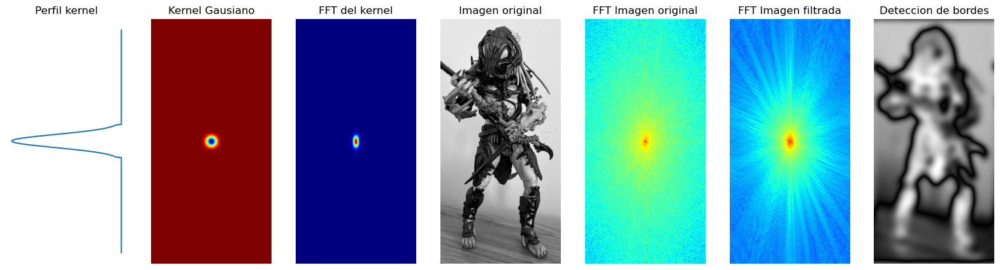

K_size:  100  Sigma:  10


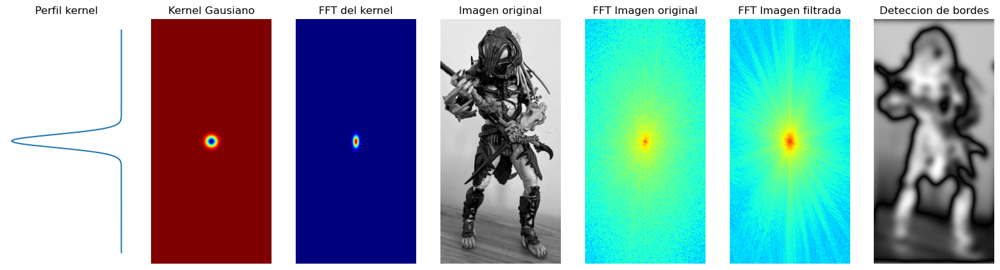

K_size:  3  Sigma:  100


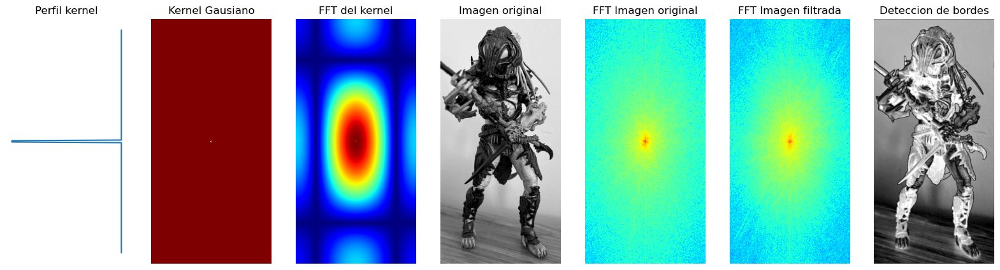

K_size:  10  Sigma:  100


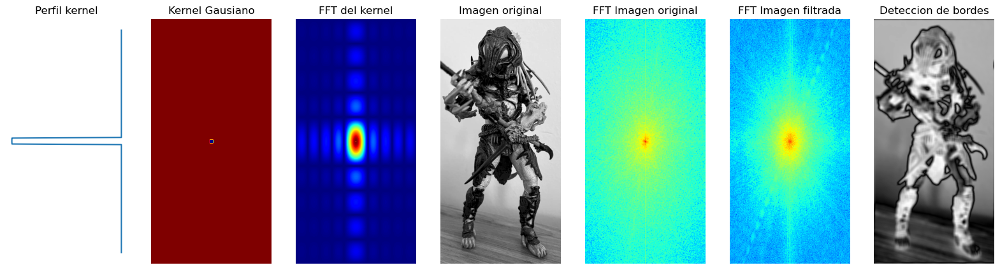

K_size:  50  Sigma:  100


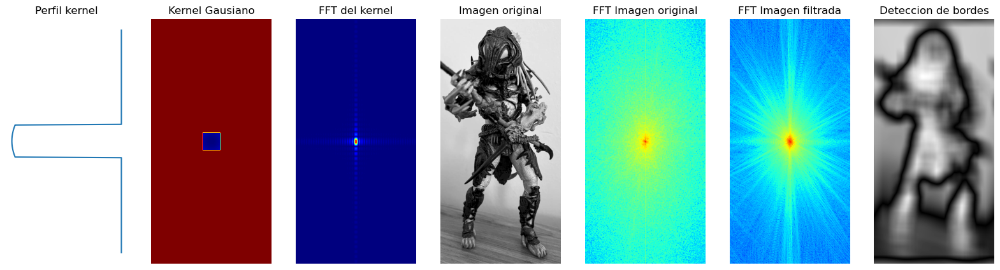

K_size:  100  Sigma:  100


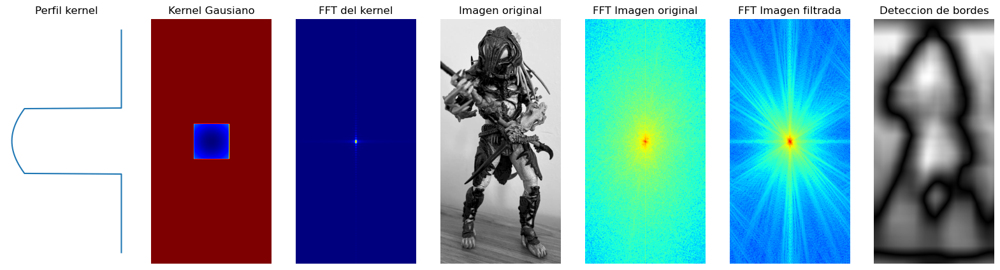

In [12]:
# Loop distintos k_size y sigmas HP
h,w = img.shape

k_size = [3,10,50,100]
sigmas = [1,10,100]

for sigma in sigmas:
    for size in k_size:
    
        print('K_size: ', size, ' Sigma: ', sigma)
        # Generacion del kernel gausiano y su FFT
        kernel, _ = create_gauss_filter(h, w, k_size=size, sigma=sigma)
        # Se transforma en pasa altos restando a su valor maximo el kernel mismo
        kernel = np.full((h,w),(1/(h*w))) - kernel
        # Pasamos el filtro a domino de frecuencias
        kernel_tf =  np.fft.fft2(kernel)
        # Tomamos un perfil para análisis
        line1 = kernel[int(h/2),:]
        # Desplazamos la FFT del kernel para visualizacion
        tf_shifted = np.fft.fftshift(kernel_tf)

        # Transformacion de la imagen
        img_fft = np.fft.fft2(img)
        # Desplazamiento de la imagen
        img_fft_shift = np.fft.fftshift(img_fft)
        # Tomamos el modulo para visualizar
        img_fft_mod = fft2_mod(img)

        # Filtramos en el dominio de la frecuencia
        filtered = img_fft_shift * tf_shifted
        # Anti-transformamos la imagen filtrada
        img_gauss = np.abs(np.fft.ifftshift(np.fft.ifft2(filtered)))
        # img_gauss = np.abs(np.fft.ifft2(np.fft.ifftshift(filtered)))

        # Diccionario de resultados para visualizar
        results = {
            "Perfil kernel": (line1, range(w)),
            "Kernel Gausiano": (kernel, 'jet'),
            "FFT del kernel": (np.abs(tf_shifted), 'jet'),
            "Imagen original": (img, 'gray'),
            "FFT Imagen original": (img_fft_mod, 'jet'),
            "FFT Imagen filtrada": (fft2_mod(img_gauss), 'jet'),
            "Deteccion de bordes": (img_gauss, 'gray')
        }

        plot_results(results, figsize=(20,5))

        

Se implementa con éxito el detector de bordes en el dominio espectral.

### Implementacion Frequency Domain Image Blur Measure (FM)

**Usando el método descripto en el paper “Image Sharpness Measure for Blurred Images in Frequency 
Domain” comparar el resultado de un filtrado por convolución con el filtrado espectral.**


In [13]:
def get_FM(img:np.array)->float:

    # Image size
    M,N = img.shape
    # Step 1: Compute F the Fourier Transform representation of image
    F = np.fft.fft2(img)
    # Step 2: Find Fc which is obtained by shifting the origin of F to centre
    Fc = np.fft.fftshift(F)
    # Step 3: Calculate AF = abs (Fc) where AF is the absolute value of the centered Fourier transform of image
    AF = np.abs(Fc)
    # Step 4: Calculate M = max (AF) where M is the maximum value of the frequency component in F
    M1 = np.max(AF)
    # Step 5: Calculate TH = the total number of pixels in F whose pixel value > thres, where thres = M/1000
    thres = M1/1000
    Th = np.sum(F>thres)
    # Step 6: Calculate Image Quality measure (FM)
    FM = Th/(M*N)

    return FM

Recorremos las imagenes seleccionadas para el análisis y se realiza el desenfoque gausiano tanto en espacio como en frecuencia, guardando la metrica en ambos casos para graficar posteriormente.

In [14]:
results_dict_fm = {}

imgs_root = './images'
for img_name in os.listdir(imgs_root):
    if img_name.endswith('JPG'):

        img = cv.imread(f'{imgs_root}/{img_name}', cv.IMREAD_GRAYSCALE)

        sigmas = np.arange(1,100,5)/10
        results = []
        for sigma in sigmas:

            # Dominio espacial
            img_blur = cv.GaussianBlur(img, ksize=(17, 17), sigmaX=sigma,  sigmaY=sigma)
            FM_espacial = get_FM(img_blur)

            # Dominio espectral
            h,w = img.shape
            kernel, kernel_tf = create_gauss_filter(h, w, k_size=17, sigma=sigma)
            # Transformada de Fourier de la imagen
            img_fft = np.fft.fft2(img)
            # Filtrado en frecuencia mediante convolución
            filtered = img_fft * kernel_tf
            # Volvemos al dominio espacial para visualizar el efecto del filtrado
            img_gauss = np.fft.ifftshift(np.real(np.fft.ifft2(filtered)))
            FM_espectral = get_FM(img_gauss)


            results.append((sigma,FM_espacial,FM_espectral))
        
        results_dict_fm[img_name] = results

Graficamos los resultados

NameError: name 'results_dict' is not defined

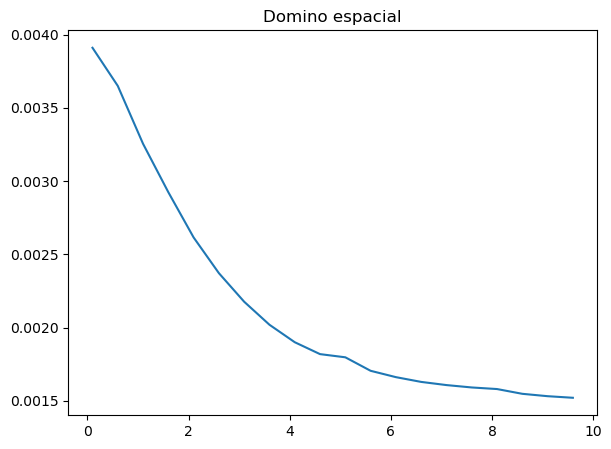

In [15]:
plt.figure(figsize=(15,5))
for k,v in results_dict_fm.items():

    results = np.array(v)
    plt.subplot(1,2,1)
    plt.plot(results[:,0],results[:,1])
    plt.title('Domino espacial')
    plt.legend(results_dict.keys())
    plt.subplot(1,2,2)
    plt.plot(results[:,0],results[:,2])
    plt.title('Dominio espectral')
    plt.legend(results_dict.keys())

plt.suptitle('FM vs Standard Deviation of Gaussian Blur')
plt.show()

Graficamos de a pares los coeficientes para los dos dominios y para cada imagen, para observar la variación:

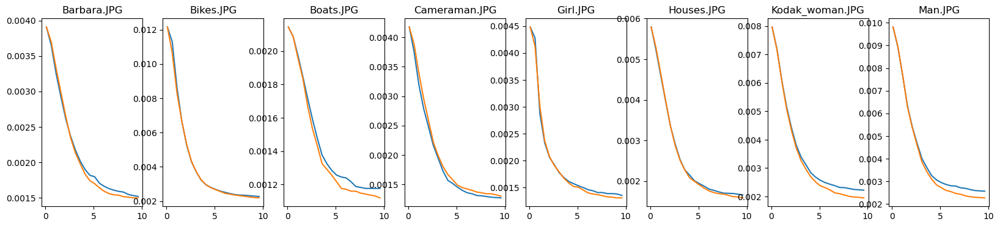

In [ ]:
n_figs = 8
plt.figure(figsize=(20,4))
for i,(k,v) in enumerate(results_dict_fm.items()):

    results = np.array(v)
    plt.subplot(1,n_figs,i+1)
    plt.plot(results[:,0],results[:,1])
    plt.plot(results[:,0],results[:,2])
    plt.title(k)
plt.show()

Calculamos la diferencia de coeficientes entre espacio y frecuencia:

In [ ]:
total = 0
for k,v in results_dict_fm.items():
    v = np.array(v)
    v_max = np.max([np.max(v[:,1]),np.max(v[:,2])])
    v_min = np.min([np.min(v[:,1]),np.min(v[:,2])])
    rango_dinamico = v_max - v_min
    print(k)
    delta = np.sum(np.abs(v[:,1]-v[:,2])) / rango_dinamico
    print(delta)
    total += delta

print('\nDiferencia total: ', total)

Barbara.JPG
0.4359550561797753
Bikes.JPG
0.159742828882295
Boats.JPG
0.7444444444444445
Cameraman.JPG
0.4999999999999996
Girl.JPG
0.31600831600831636
Houses.JPG
0.18823529411764683
Kodak_woman.JPG
0.5514705882352939
Man.JPG
0.505125815470643

Diferencia total:  3.4009823433384145


Se valida la equivalencia entre los dos métodos de filtrado, con pequeñas variaciones.

### Implementación de coeficiente de desenfoque

**Repetir la comparación usando uno de los métodos descriptos en el apéndice del paper “Analysis of 
focus measure operators in shape-from-focus"**

Se selecciona el método *A.33. Sum of wavelet coefficients (WAV1)*

![image](./note_imgs/wav_form.JPG)
---
![image](./note_imgs/wav_proc.JPG)

Para la obtención de los coeficientes de la tranformada Wavelet se utiliza la librería pywt (https://pywavelets.readthedocs.io/en/latest/)

In [ ]:
def get_wav1_coef(img:np.array)-> float:
            
    # Image size    
    M, N = img.shape

    # Obtención de los coeficientes 
    _,(LH1,HL1,HH1)= pywt.dwt2(img, 'haar')

    blur_coef = np.sum(np.abs(LH1)+np.abs(HL1)+np.abs(HH1))/(M*N)
    return blur_coef

In [ ]:
import os

results_dict_wt = {}

imgs_root = './images'
for img_name in os.listdir(imgs_root):
    if img_name.endswith('JPG'):

        img = cv.imread(f'{imgs_root}/{img_name}', cv.IMREAD_GRAYSCALE)

        sigmas = np.arange(1,100,5)/10

        results = []
        for sigma in sigmas:

            # Dominio espacial
            img_blur = cv.GaussianBlur(img, ksize=(17, 17), sigmaX=sigma,  sigmaY=sigma)
            wav_coef_espacial = get_wav1_coef(img_blur)

            # Dominio espectral
            h,w = img.shape
            kernel, kernel_tf = create_gauss_filter(h, w, k_size=17, sigma=sigma)
            # Transformada de Fourier de la imagen
            img_fft = np.fft.fft2(img)
            # Filtrado en frecuencia mediante convolución
            filtered = img_fft * kernel_tf
            # Volvemos al dominio espacial para visualizar el efecto del filtrado
            img_gauss = np.fft.ifftshift(np.real(np.fft.ifft2(filtered)))
            wav_coef_espectral = get_wav1_coef(img_gauss)
            
            results.append((sigma,wav_coef_espacial,wav_coef_espectral))
        
        results_dict_wt[img_name] = results

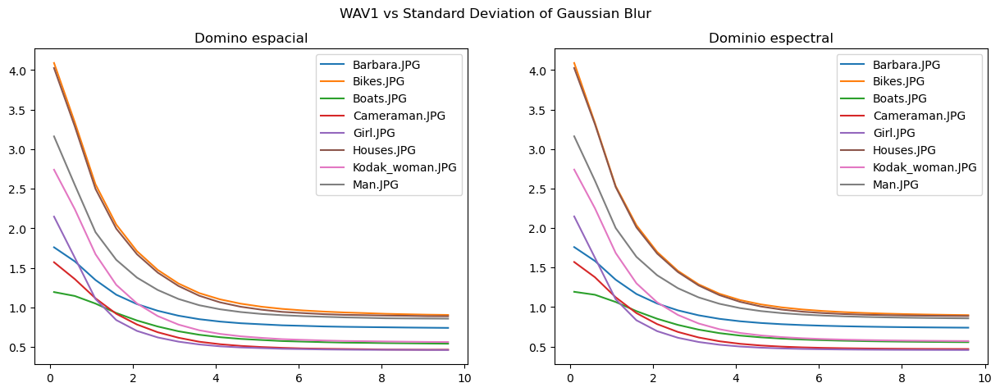

In [ ]:
plt.figure(figsize=(15,5))
for k,v in results_dict_wt.items():

    results = np.array(v)
    plt.subplot(1,2,1)
    plt.plot(results[:,0],results[:,1])
    plt.title('Domino espacial')
    plt.legend(results_dict.keys())
    plt.subplot(1,2,2)
    plt.plot(results[:,0],results[:,2])
    plt.title('Dominio espectral')
    plt.legend(results_dict.keys())

plt.suptitle('WAV1 vs Standard Deviation of Gaussian Blur')
plt.show()

Graficamos de a pares los coeficientes para los dos dominios y para cada imagen, para observar la variación:

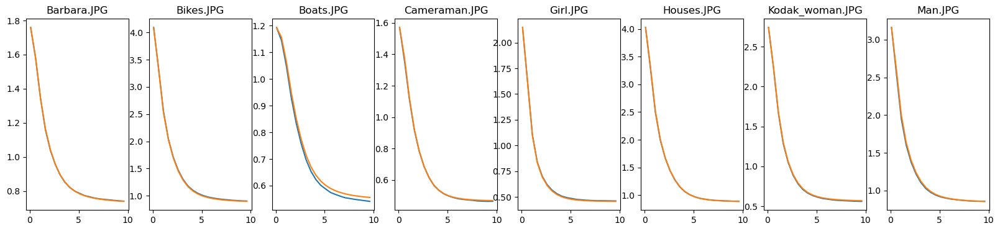

In [ ]:
n_figs = 8
plt.figure(figsize=(20,4))
for i,(k,v) in enumerate(results_dict_wt.items()):

    results = np.array(v)
    plt.subplot(1,n_figs,i+1)
    plt.plot(results[:,0],results[:,1])
    plt.plot(results[:,0],results[:,2])
    plt.title(k)
plt.show()


Validamos la similaridad de las metricas:

In [ ]:
total = 0
for k,v in results_dict_wt.items():
    v = np.array(v)
    v_max = np.max([np.max(v[:,1]),np.max(v[:,2])])
    v_min = np.min([np.min(v[:,1]),np.min(v[:,2])])
    rango_dinamico = v_max - v_min
    print(k)
    delta = np.sum(np.abs(v[:,1]-v[:,2])) / rango_dinamico
    print(delta)
    total += delta

print('\nDiferencia total: ', total)

Barbara.JPG
0.034529540508155834
Bikes.JPG
0.06658742637080477
Boats.JPG
0.4441891010562115
Cameraman.JPG
0.06741061516741179
Girl.JPG
0.06766623930422172
Houses.JPG
0.03269187022459488
Kodak_woman.JPG
0.0757061982496385
Man.JPG
0.11245185270657808

Diferencia total:  0.9012328435876171


**Observaciones:**

*  Si bien WAV1 es un metodo para medir el des-enfoque de una imagen, el efecto es muy similar al blur causado por objetos en movimiento
*  A simple vista se puede ver una mayor consitencia entre los resultados del indice de WAV1 en espacio y frecuencia, respecto de los resultados con el metodo FM, calculando el delta entre el coeficiente por imagen, la suma total de las diferencias es efectivamente menor.
    

Por último graficamos los coeficientes para cada imagen, tanto en espacio como en frecuencia:

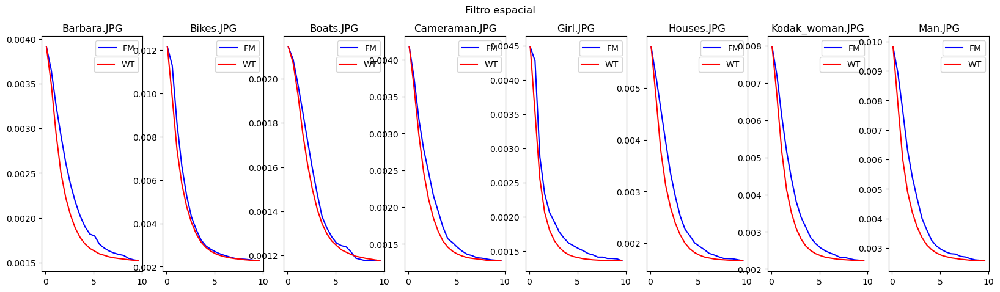

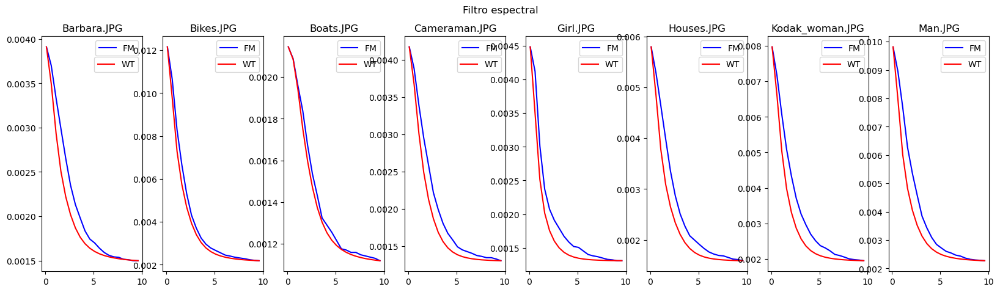

In [ ]:
imgs_names = results_dict_wt.keys()
n_figs = 8
plt.figure(figsize=(20,5))
for i,img_name in enumerate(imgs_names):
    coefs_fm = np.array(results_dict_fm[img_name])
    coefs_wt = np.array(results_dict_wt[img_name])

    plt.subplot(1,n_figs,i+1)
    plt.plot(coefs_fm[:,0],coefs_fm[:,1],label='FM',color='b')
    plt.legend(['FM'])
    ax1 = plt.gca()
    ax2 = ax1.twinx()
    ax2.plot(coefs_wt[:,0],coefs_wt[:,1],label='WT',color='r')
    ax2.axis('off')
    plt.title(img_name)
    plt.legend(['WT'],bbox_to_anchor=(1, 0.93))

plt.suptitle('Filtro espacial')
plt.show()

plt.figure(figsize=(20,5))
for i,img_name in enumerate(imgs_names):
    coefs_fm = np.array(results_dict_fm[img_name])
    coefs_wt = np.array(results_dict_wt[img_name])

    plt.subplot(1,n_figs,i+1)
    plt.plot(coefs_fm[:,0],coefs_fm[:,2],label='FM',color='b')
    plt.legend(['FM'])
    ax1 = plt.gca()
    ax2 = ax1.twinx()
    ax2.plot(coefs_wt[:,0],coefs_wt[:,2],label='WT',color='r')
    ax2.axis('off')
    plt.title(img_name)
    plt.legend(['WT'],bbox_to_anchor=(1, 0.93))

plt.suptitle('Filtro espectral')
plt.show()

In [ ]:
to = time.time()

print('Tiempo de ejecución total: ', round(to-since), 'secs.')

Tiempo de ejecución total:  96 secs.
